# **Задача 1. Анализ модели CNN**

Провести анализ качества аппроксимации выборки EMNIST-letters моделью сверточной нейронной сети в зависимости от:


1.   размера ядра (можно ввести ограничение, что на каждом слое размер ядра одинаковый);
2.   числа слоев;
3.   от пулинга;
4.   добавления BatchNorm;
5.   параметра dropout.




Все выводы должны быть представленны в формате tensorboard (каждый набор параметров, свой график, пример 16-й семинар).

P.S. Выборку можно взять из torchvision.

P.S.S Если не работает скачиваение EMNIST использовать FahionMnist.

Пояснение: В данном задании важно продемонстрировать умение строить различные структуры модели CNN. Не обязательно выполнять перебор всех вариантов нейросети (проходить по сетке гиперпараметров), но описание экспериментов должны присутвовать.

In [2]:
import torch
import numpy as np
from tqdm.notebook import tqdm
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from matplotlib import gridspec
from sklearn.metrics import classification_report
from torch.utils.tensorboard import SummaryWriter

In [ ]:
!pip install --upgrade torchvision

In [3]:
import warnings
warnings.filterwarnings("ignore")

# Задаем устройство выполнения кода  (CPU/CUDA)

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

## Сверточная нейронная сеть


###код для обучения модели

In [5]:
def train_on_batch(model, x_batch, y_batch, optimizer, loss_function):
    model.train()
    model.zero_grad() #чтобы избежать накопления

    output = model(x_batch.to(device))

    loss = loss_function(output, y_batch.to(device))
    loss.backward()

    optimizer.step()  #обновляем веса модели в напр уменьшения функции потерь
    return loss.cpu().item()

In [6]:
def train_epoch(train_generator, model, loss_function, optimizer, callback = None):
    epoch_loss = 0
    total = 0
    for it, (batch_of_x, batch_of_y) in enumerate(train_generator):
        batch_loss = train_on_batch(model, batch_of_x.to(device), batch_of_y.to(device), optimizer, loss_function)

        if callback is not None:
            callback(model, batch_loss)

        epoch_loss += batch_loss*len(batch_of_x)
        total += len(batch_of_x)

    return epoch_loss/total

In [7]:
def trainer(count_of_epoch,
            batch_size,
            dataset,
            model,
            loss_function,
            optimizer,
            lr = 0.001,
            callback = None):

    optima = optimizer(model.parameters(), lr=lr)

    iterations = tqdm(range(count_of_epoch), desc='epoch')
    iterations.set_postfix({'train epoch loss': np.nan})
    for it in iterations:
        batch_generator = tqdm(
            torch.utils.data.DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True),
            leave=False, total=len(dataset)//batch_size+(len(dataset)%batch_size> 0))

        epoch_loss = train_epoch(train_generator=batch_generator,
                    model=model,
                    loss_function=loss_function,
                    optimizer=optima,
                    callback=callback)

        iterations.set_postfix({'train epoch loss': epoch_loss})

### Модель нейросети


In [8]:
class CNN(torch.nn.Module):
    @property
    def device(self):
        for p in self.parameters():
            return p.device

    def __init__(self):
        super(CNN, self).__init__()

        self.layers = torch.nn.Sequential()
        self.layers.add_module('conv1', torch.nn.Conv2d(1, 1*6, kernel_size = 5))
        self.layers.add_module('relu1', torch.nn.ReLU())
        self.layers.add_module('pool1', torch.nn.MaxPool2d(kernel_size = 2))
        self.layers.add_module('conv2', torch.nn.Conv2d(1*6, 1*16, kernel_size = 5))
        self.layers.add_module('relu2', torch.nn.ReLU())
        self.layers.add_module('pool2', torch.nn.MaxPool2d(kernel_size = 2))


        self.layers.add_module('flatten', torch.nn.Flatten())
        self.layers.add_module('linear1', torch.nn.Linear(16*4*4, 120))
        self.layers.add_module('relu3', torch.nn.ReLU())
        self.layers.add_module('linear2', torch.nn.Linear(120, 84))
        self.layers.add_module('relu4', torch.nn.ReLU())
        self.layers.add_module('linear3', torch.nn.Linear(84, 10)) #тоже 10 классов

    def forward(self, input):
        return self.layers(input)

## Выборка


К сожалению не получилось скачать EMNIST, поэтому работаем с FashionMNIST

смотреть на одежду приятнее чем на буковки 💅💅💅💅💅💅

In [ ]:
!rm -r emnist

In [9]:
FMNIST_train = datasets.FashionMNIST('./fmnist', train=True, download=True,
                             transform=transforms.ToTensor())

FMNIST_test = datasets.FashionMNIST('./fmnist', train=False, download=True,
                            transform=transforms.ToTensor())



100%|██████████| 26421880/26421880 [00:03<00:00, 7712228.32it/s] 


Extracting ./fmnist/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./fmnist/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 140087.79it/s]


Extracting ./fmnist/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./fmnist/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:01<00:00, 2562955.88it/s]


Extracting ./fmnist/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./fmnist/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 19159074.53it/s]


Extracting ./fmnist/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./fmnist/FashionMNIST/raw



In [ ]:
print("Количество классов FashionMNIST:", len(FMNIST_train.classes), len(FMNIST_test.classes))

Количество классов FashionMNIST: 10 10


In [ ]:
print("Список классов в обучающем наборе FashionMNIST:")
print(FMNIST_train.classes)

Список классов в обучающем наборе FashionMNIST:
['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']


In [ ]:
print(FMNIST_train)

Dataset FashionMNIST
    Number of datapoints: 60000
    Root location: ./fmnist
    Split: Train
    StandardTransform
Transform: ToTensor()


In [ ]:
print(FMNIST_test)


Dataset FashionMNIST
    Number of datapoints: 10000
    Root location: ./fmnist
    Split: Test
    StandardTransform
Transform: ToTensor()


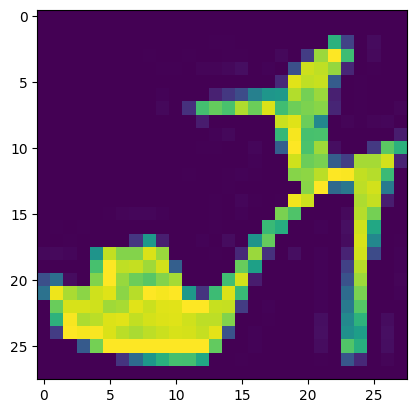

In [ ]:
plt.imshow(FMNIST_train[9][0].squeeze()) # :)

In [ ]:
FMNIST_train[0][0].shape

torch.Size([1, 28, 28])

то есть у нас одноканальные изображения размером 28 на 28 пикселей

### Инициализация модели

In [10]:
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam

model = CNN()
model.to(device)

CNN(
  (layers): Sequential(
    (conv1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1))
    (relu1): ReLU()
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (relu2): ReLU()
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (linear1): Linear(in_features=256, out_features=120, bias=True)
    (relu3): ReLU()
    (linear2): Linear(in_features=120, out_features=84, bias=True)
    (relu4): ReLU()
    (linear3): Linear(in_features=84, out_features=10, bias=True)
  )
)

### Качество аппроксимации до обучения

In [ ]:
batch_generator = torch.utils.data.DataLoader(dataset = FMNIST_test,
                                              batch_size=64)

pred = []
real = []
test_loss = 0
for it, (x_batch, y_batch) in enumerate(batch_generator):
    x_batch = x_batch.to(device)
    y_batch = y_batch.to(device)

    output = model(x_batch)

    test_loss += loss_function(output, y_batch).cpu().item()*len(x_batch)

    pred.extend(torch.argmax(output, dim=-1).cpu().numpy().tolist())
    real.extend(y_batch.cpu().numpy().tolist())

test_loss /= len(FMNIST_test)

print('loss: {}'.format(test_loss))

loss: 2.3050566265106203


### Визуализация каждого слоя сверточной нейросети

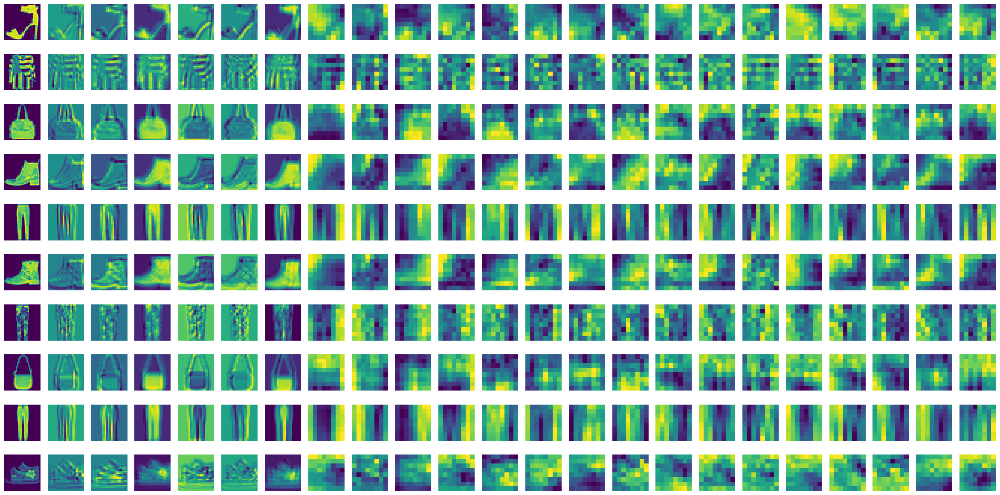

In [ ]:
x = x_batch[-10:]
y = model.layers.conv1(x)
z = model.layers.conv2(model.layers.pool1(model.layers.relu1(y)))

fig = plt.figure(figsize=(30, 15))
gs = gridspec.GridSpec(10, 23)
ax = np.empty([10, 23], dtype=object)
for i in range(10):
    for j in range(23):
        ax[i][j] = fig.add_subplot(gs[i, j])
for i in range(len(x)):
    ax[i][0].imshow(x.cpu().data[i, 0].numpy())
    ax[i][0].axis("off")
    for j in range(1, 7):
        ax[i][j].imshow(y.cpu().data[i, j-1].numpy())
        ax[i][j].axis("off")

    for j in range(7, 23):
        ax[i][j].imshow(z.cpu().data[i, j-7].numpy())
        ax[i][j].axis("off")

### Обучение модели

In [ ]:
trainer(count_of_epoch = 1,
        batch_size = 64,
        dataset = FMNIST_train,
        model = model,
        loss_function = loss_function,
        optimizer = optimizer,
        lr = 0.001,
        callback = None)

epoch:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

### Качество аппроксимации после обучения

In [ ]:
batch_generator = torch.utils.data.DataLoader(dataset = FMNIST_test,
                                              batch_size=64)

pred = []
real = []
test_loss = 0
for it, (x_batch, y_batch) in enumerate(batch_generator):
    x_batch = x_batch.to(device)
    y_batch = y_batch.to(device)

    output = model(x_batch)

    test_loss += loss_function(output, y_batch).cpu().item()*len(x_batch)

    pred.extend(torch.argmax(output, dim=-1).cpu().numpy().tolist())
    real.extend(y_batch.cpu().numpy().tolist())

test_loss /= len(FMNIST_test)

print('loss: {}'.format(test_loss))

loss: 0.5509339841842651


### Визуализация каждого слоя сверточной нейросети

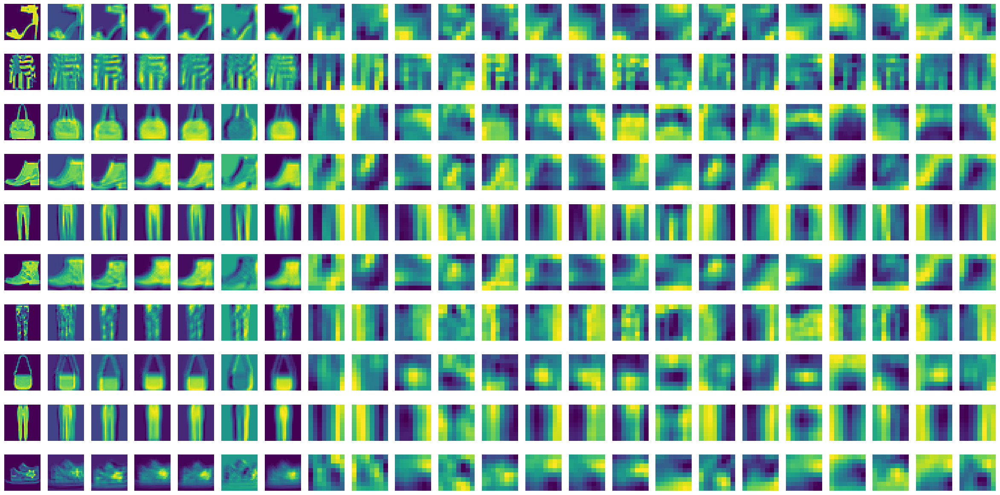

In [ ]:
x = x_batch[-10:]
y = model.layers.conv1(x)
z = model.layers.conv2(model.layers.pool1(model.layers.relu1(y)))

fig = plt.figure(figsize=(30, 15))
gs = gridspec.GridSpec(10, 23)
ax = np.empty([10, 23], dtype=object)
for i in range(10):
    for j in range(23):
        ax[i][j] = fig.add_subplot(gs[i, j])
for i in range(len(x)):
    ax[i][0].imshow(x.cpu().data[i, 0].numpy())
    ax[i][0].axis("off")
    for j in range(1, 7):
        ax[i][j].imshow(y.cpu().data[i, j-1].numpy())
        ax[i][j].axis("off")

    for j in range(7, 23):
        ax[i][j].imshow(z.cpu().data[i, j-7].numpy())
        ax[i][j].axis("off")

## Отслеживание обучения модели

In [38]:
%load_ext tensorboard
%tensorboard --logdir experiment/

<IPython.core.display.Javascript object>

In [11]:
class callback():
    def __init__(self, writer, dataset, loss_function, delimeter = 100, batch_size=64):
        self.step = 0
        self.writer = writer
        self.delimeter = delimeter
        self.loss_function = loss_function
        self.batch_size = batch_size

        self.dataset = dataset

    def forward(self, model, loss):
        self.step += 1
        self.writer.add_scalar('LOSS/train', loss, self.step)

        if self.step % self.delimeter == 0:

            self.writer.add_graph(model, self.dataset[0][0].view(1,1,28,28).to(model.device))

            batch_generator = torch.utils.data.DataLoader(dataset = self.dataset,
                                                          batch_size=self.batch_size)

            pred = []
            real = []
            test_loss = 0
            model.eval()
            for it, (x_batch, y_batch) in enumerate(batch_generator):
                x_batch = x_batch.to(model.device)
                y_batch = y_batch.to(model.device)

                output = model(x_batch)

                test_loss += self.loss_function(output, y_batch).cpu().item()*len(x_batch)

                pred.extend(torch.argmax(output, dim=-1).cpu().numpy().tolist())
                real.extend(y_batch.cpu().numpy().tolist())

            test_loss /= len(self.dataset)

            self.writer.add_scalar('LOSS/test', test_loss, self.step)

            self.writer.add_text('REPORT/test', str(classification_report(real, pred)), self.step)

            x = x_batch[-10:]
            y = model.layers.conv1(x.to(model.device))
            z = model.layers.conv2(model.layers.pool1(model.layers.relu1(y)))

            fig = plt.figure(figsize=(30, 15))
            gs = gridspec.GridSpec(10, 23)
            ax = np.empty([10, 23], dtype=object)
            for i in range(10):
                for j in range(23):
                    ax[i][j] = fig.add_subplot(gs[i, j])
            for i in range(len(x)):
                ax[i][0].imshow(x.cpu().data[i, 0].numpy())
                ax[i][0].axis("off")
                for j in range(1, 7):
                    ax[i][j].imshow(y.cpu().data[i, j-1].numpy())
                    ax[i][j].axis("off")

                for j in range(7, 23):
                    ax[i][j].imshow(z.cpu().data[i, j-7].numpy())
                    ax[i][j].axis("off")
            self.writer.add_figure('CNN/convs', fig, self.step)

    def __call__(self, model, loss):
        return self.forward(model, loss)

In [ ]:
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam

model = CNN()
model.to(device)

CNN(
  (layers): Sequential(
    (conv1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1))
    (relu1): ReLU()
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (relu2): ReLU()
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (linear1): Linear(in_features=256, out_features=120, bias=True)
    (relu3): ReLU()
    (linear2): Linear(in_features=120, out_features=84, bias=True)
    (relu4): ReLU()
    (linear3): Linear(in_features=84, out_features=10, bias=True)
  )
)

In [ ]:
writer = SummaryWriter(log_dir = 'experiment')

call = callback(writer, FMNIST_test, loss_function, delimeter = 10)

In [ ]:
trainer(count_of_epoch = 1,
        batch_size = 64,
        dataset = FMNIST_train,
        model = model,
        loss_function = loss_function,
        optimizer = optimizer,
        lr = 0.001,
        callback = call)

epoch:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

### Теперь собственно ДЗ

# Варьирование размера ядра (3, 5, 7)

In [20]:
class CNN_2L_ker3(torch.nn.Module):
    @property
    def device(self):
        for p in self.parameters():
            return p.device

    def __init__(self):
        super(CNN_2L_ker3, self).__init__()

        self.layers = torch.nn.Sequential()
        self.layers.add_module('conv1', torch.nn.Conv2d(1, 1*6, kernel_size = 3))
        self.layers.add_module('relu1', torch.nn.ReLU())
        self.layers.add_module('pool1', torch.nn.MaxPool2d(kernel_size = 2))
        self.layers.add_module('conv2', torch.nn.Conv2d(1*6, 1*16, kernel_size = 3))
        self.layers.add_module('relu2', torch.nn.ReLU())
        self.layers.add_module('pool2', torch.nn.MaxPool2d(kernel_size = 2))


        self.layers.add_module('flatten', torch.nn.Flatten())
        self.layers.add_module('linear1', torch.nn.Linear(16*5*5, 120))
        self.layers.add_module('relu3', torch.nn.ReLU())
        self.layers.add_module('linear2', torch.nn.Linear(120, 84))
        self.layers.add_module('relu4', torch.nn.ReLU())
        self.layers.add_module('linear3', torch.nn.Linear(84, 10)) #тоже 10 классов

    def forward(self, input):
        return self.layers(input)

In [21]:
model = CNN_2L_ker3()
model.to(device)

writer = SummaryWriter(log_dir = 'experiment/CNN_2L_ker3')

call = callback(writer, FMNIST_test, loss_function, delimeter = 100)


In [22]:
trainer(count_of_epoch = 1,
        batch_size = 64,
        dataset = FMNIST_train,
        model = model,
        loss_function = loss_function,
        optimizer = optimizer,
        lr = 0.001,
        callback = call)



epoch:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

In [23]:
class CNN_2L_ker5(torch.nn.Module):
    @property
    def device(self):
        for p in self.parameters():
            return p.device

    def __init__(self):
        super(CNN_2L_ker5, self).__init__()

        self.layers = torch.nn.Sequential()
        self.layers.add_module('conv1', torch.nn.Conv2d(1, 1*6, kernel_size = 5))
        self.layers.add_module('relu1', torch.nn.ReLU())
        self.layers.add_module('pool1', torch.nn.MaxPool2d(kernel_size = 2))
        self.layers.add_module('conv2', torch.nn.Conv2d(1*6, 1*16, kernel_size = 5))
        self.layers.add_module('relu2', torch.nn.ReLU())
        self.layers.add_module('pool2', torch.nn.MaxPool2d(kernel_size = 2))


        self.layers.add_module('flatten', torch.nn.Flatten())
        self.layers.add_module('linear1', torch.nn.Linear(16*4*4, 120))
        self.layers.add_module('relu3', torch.nn.ReLU())
        self.layers.add_module('linear2', torch.nn.Linear(120, 84))
        self.layers.add_module('relu4', torch.nn.ReLU())
        self.layers.add_module('linear3', torch.nn.Linear(84, 10)) #тоже 10 классов

    def forward(self, input):
        return self.layers(input)

In [24]:
model = CNN_2L_ker5()
model.to(device)

writer = SummaryWriter(log_dir = 'experiment/CNN_2L_ker5')

call = callback(writer, FMNIST_test, loss_function, delimeter = 100)

In [25]:
trainer(count_of_epoch = 1,
        batch_size = 64,
        dataset = FMNIST_train,
        model = model,
        loss_function = loss_function,
        optimizer = optimizer,
        lr = 0.001,
        callback = call)

epoch:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

In [29]:
class CNN_2L_ker7(torch.nn.Module):
    @property
    def device(self):
        for p in self.parameters():
            return p.device

    def __init__(self):
        super(CNN_2L_ker7, self).__init__()

        self.layers = torch.nn.Sequential()
        self.layers.add_module('conv1', torch.nn.Conv2d(1, 1*6, kernel_size = 7))
        self.layers.add_module('relu1', torch.nn.ReLU())
        self.layers.add_module('pool1', torch.nn.MaxPool2d(kernel_size = 2))
        self.layers.add_module('conv2', torch.nn.Conv2d(1*6, 1*16, kernel_size = 7))
        self.layers.add_module('relu2', torch.nn.ReLU())
        self.layers.add_module('pool2', torch.nn.MaxPool2d(kernel_size = 2))


        self.layers.add_module('flatten', torch.nn.Flatten())
        self.layers.add_module('linear1', torch.nn.Linear(16*2*2, 120))
        self.layers.add_module('relu3', torch.nn.ReLU())
        self.layers.add_module('linear2', torch.nn.Linear(120, 84))
        self.layers.add_module('relu4', torch.nn.ReLU())
        self.layers.add_module('linear3', torch.nn.Linear(84, 10)) #тоже 10 классов

    def forward(self, input):
        return self.layers(input)

In [30]:
model = CNN_2L_ker7()
model.to(device)

writer = SummaryWriter(log_dir = 'experiment/CNN_2L_ker7')

call = callback(writer, FMNIST_test, loss_function, delimeter = 100)

In [31]:
trainer(count_of_epoch = 1,
        batch_size = 64,
        dataset = FMNIST_train,
        model = model,
        loss_function = loss_function,
        optimizer = optimizer,
        lr = 0.001,
        callback = call)

epoch:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

по графикам в tensor board видно, что маленький размер ядра улучшает модель , это связано с тем, что маленький размер ядра позволяет получить более мелкие признаки. что в нашей задаче полезно

# Варьирование числа слоев(2, 3, 4)

Будем работать с размером ядра 3, с пулингом только на первом слое

In [32]:
class CNN_2L_ker3_1pull(torch.nn.Module):
    @property
    def device(self):
        for p in self.parameters():
            return p.device

    def __init__(self):
        super(CNN_2L_ker3_1pull, self).__init__()

        self.layers = torch.nn.Sequential()
        self.layers.add_module('conv1', torch.nn.Conv2d(1, 1*6, kernel_size = 3))
        self.layers.add_module('relu1', torch.nn.ReLU())
        self.layers.add_module('pool1', torch.nn.MaxPool2d(kernel_size = 2))
        self.layers.add_module('conv2', torch.nn.Conv2d(1*6, 1*16, kernel_size = 3))
        self.layers.add_module('relu2', torch.nn.ReLU())


        self.layers.add_module('flatten', torch.nn.Flatten())
        self.layers.add_module('linear1', torch.nn.Linear(16*11*11, 120))
        self.layers.add_module('relu3', torch.nn.ReLU())
        self.layers.add_module('linear2', torch.nn.Linear(120, 84))
        self.layers.add_module('relu4', torch.nn.ReLU())
        self.layers.add_module('linear3', torch.nn.Linear(84, 10)) #тоже 10 классов

    def forward(self, input):
        return self.layers(input)

In [33]:
model = CNN_2L_ker3_1pull()
model.to(device)

writer = SummaryWriter(log_dir = 'experiment/CNN_2L_ker3_1pull')

call = callback(writer, FMNIST_test, loss_function, delimeter = 100)
trainer(count_of_epoch = 1,
        batch_size = 64,
        dataset = FMNIST_train,
        model = model,
        loss_function = loss_function,
        optimizer = optimizer,
        lr = 0.001,
        callback = call)

epoch:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

In [34]:
class CNN_3L_ker3_1pull(torch.nn.Module):
    @property
    def device(self):
        for p in self.parameters():
            return p.device

    def __init__(self):
        super(CNN_3L_ker3_1pull, self).__init__()

        self.layers = torch.nn.Sequential()
        self.layers.add_module('conv1', torch.nn.Conv2d(1, 1*6, kernel_size = 3))
        self.layers.add_module('relu1', torch.nn.ReLU())
        self.layers.add_module('pool1', torch.nn.MaxPool2d(kernel_size = 2))
        self.layers.add_module('conv2', torch.nn.Conv2d(1*6, 1*16, kernel_size = 3))
        self.layers.add_module('relu2', torch.nn.ReLU())
        self.layers.add_module('conv3', torch.nn.Conv2d(1*16, 1*32, kernel_size = 3))
        self.layers.add_module('relu3', torch.nn.ReLU())


        self.layers.add_module('flatten', torch.nn.Flatten())
        self.layers.add_module('linear1', torch.nn.Linear(32*9*9, 120))
        self.layers.add_module('relu3', torch.nn.ReLU())
        self.layers.add_module('linear2', torch.nn.Linear(120, 84))
        self.layers.add_module('relu4', torch.nn.ReLU())
        self.layers.add_module('linear3', torch.nn.Linear(84, 10)) #тоже 10 классов

    def forward(self, input):
        return self.layers(input)

In [35]:
model = CNN_3L_ker3_1pull()
model.to(device)

writer = SummaryWriter(log_dir = 'experiment/CNN_3L_ker3_1pull')

call = callback(writer, FMNIST_test, loss_function, delimeter = 100)
trainer(count_of_epoch = 1,
        batch_size = 64,
        dataset = FMNIST_train,
        model = model,
        loss_function = loss_function,
        optimizer = optimizer,
        lr = 0.001,
        callback = call)

epoch:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

In [36]:
class CNN_4L_ker3_1pull(torch.nn.Module):
    @property
    def device(self):
        for p in self.parameters():
            return p.device

    def __init__(self):
        super(CNN_4L_ker3_1pull, self).__init__()

        self.layers = torch.nn.Sequential()
        self.layers.add_module('conv1', torch.nn.Conv2d(1, 1*6, kernel_size = 3))
        self.layers.add_module('relu1', torch.nn.ReLU())
        self.layers.add_module('pool1', torch.nn.MaxPool2d(kernel_size = 2))
        self.layers.add_module('conv2', torch.nn.Conv2d(1*6, 1*16, kernel_size = 3))
        self.layers.add_module('relu2', torch.nn.ReLU())
        self.layers.add_module('conv3', torch.nn.Conv2d(1*16, 1*32, kernel_size = 3))
        self.layers.add_module('relu3', torch.nn.ReLU())
        self.layers.add_module('conv4', torch.nn.Conv2d(1*32, 1*64, kernel_size = 3))
        self.layers.add_module('relu4', torch.nn.ReLU())


        self.layers.add_module('flatten', torch.nn.Flatten())
        self.layers.add_module('linear1', torch.nn.Linear(64*7*7, 120))
        self.layers.add_module('relu3', torch.nn.ReLU())
        self.layers.add_module('linear2', torch.nn.Linear(120, 84))
        self.layers.add_module('relu4', torch.nn.ReLU())
        self.layers.add_module('linear3', torch.nn.Linear(84, 10)) #тоже 10 классов

    def forward(self, input):
        return self.layers(input)

In [37]:
model = CNN_4L_ker3_1pull()
model.to(device)

writer = SummaryWriter(log_dir = 'experiment/CNN_4L_ker3_1pull')

call = callback(writer, FMNIST_test, loss_function, delimeter = 100)
trainer(count_of_epoch = 1,
        batch_size = 64,
        dataset = FMNIST_train,
        model = model,
        loss_function = loss_function,
        optimizer = optimizer,
        lr = 0.001,
        callback = call)

epoch:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

увеличение числа слоёв сети должно позволить извлекать больше абстрактных признаков из данных и улучшать модель. Но у меня при количестве слоёв 4 модели немного ухудшилась.


# Пуллинг (Max / Average)
2L kernel 5 уже посчитано с maxpull, осталось почитать с  average  

In [12]:
class CNN_2L_ker5_averagepulling(torch.nn.Module):
    @property
    def device(self):
        for p in self.parameters():
            return p.device

    def __init__(self):
        super(CNN_2L_ker5_averagepulling, self).__init__()

        self.layers = torch.nn.Sequential()
        self.layers.add_module('conv1', torch.nn.Conv2d(1, 1*6, kernel_size=5))
        self.layers.add_module('relu1', torch.nn.ReLU())
        self.layers.add_module('pool1', torch.nn.AvgPool2d(kernel_size=2))
        self.layers.add_module('conv2', torch.nn.Conv2d(1*6, 1*16, kernel_size=5))
        self.layers.add_module('relu2', torch.nn.ReLU())
        self.layers.add_module('pool2', torch.nn.AvgPool2d(kernel_size=2))

        self.layers.add_module('flatten', torch.nn.Flatten())
        self.layers.add_module('linear1', torch.nn.Linear(16*4*4, 120))
        self.layers.add_module('relu3', torch.nn.ReLU())
        self.layers.add_module('linear2', torch.nn.Linear(120, 84))
        self.layers.add_module('relu4', torch.nn.ReLU())
        self.layers.add_module('linear3', torch.nn.Linear(84, 10))

    def forward(self, input):
        return self.layers(input)


In [14]:
model = CNN_2L_ker5_averagepulling()
model.to(device)

writer = SummaryWriter(log_dir = 'experiment/CNN_2L_ker5_averagepulling')

call = callback(writer, FMNIST_test, loss_function, delimeter = 100)
trainer(count_of_epoch = 1,
        batch_size = 64,
        dataset = FMNIST_train,
        model = model,
        loss_function = loss_function,
        optimizer = optimizer,
        lr = 0.001,
        callback = call)

epoch:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

по графикам в tensor board видно, что применение average pulling немного улучшило модель при малом числе шагов, но это можно объяснить тем что   average pulling позволяет сгладить шум. maxpulling обладает полезным для нашей задачи свойством нахождения объекта (большое значение если объект в ячейке есть, average pulling немного сглаживает это ), поэтому я ожидала , что он сработает лучше

# Dropout

In [15]:
class CNN_2L_ker5_dropout(torch.nn.Module):
    @property
    def device(self):
        for p in self.parameters():
            return p.device

    def __init__(self, dropout_rate=0.5):
        super(CNN_2L_ker5_dropout, self).__init__()

        self.layers = torch.nn.Sequential()
        self.layers.add_module('conv1', torch.nn.Conv2d(1, 1*6, kernel_size=5))
        self.layers.add_module('relu1', torch.nn.ReLU())
        self.layers.add_module('pool1', torch.nn.MaxPool2d(kernel_size=2))
        self.layers.add_module('dropout1', torch.nn.Dropout2d(p=dropout_rate))
        self.layers.add_module('conv2', torch.nn.Conv2d(1*6, 1*16, kernel_size=5))
        self.layers.add_module('relu2', torch.nn.ReLU())
        self.layers.add_module('pool2', torch.nn.MaxPool2d(kernel_size=2))
        self.layers.add_module('dropout2', torch.nn.Dropout2d(p=dropout_rate))

        self.layers.add_module('flatten', torch.nn.Flatten())
        self.layers.add_module('linear1', torch.nn.Linear(16*4*4, 120))
        self.layers.add_module('relu3', torch.nn.ReLU())
        self.layers.add_module('linear2', torch.nn.Linear(120, 84))
        self.layers.add_module('relu4', torch.nn.ReLU())
        self.layers.add_module('linear3', torch.nn.Linear(84, 10))

    def forward(self, input):
        return self.layers(input)


In [16]:
model = CNN_2L_ker5_dropout()
model.to(device)

writer = SummaryWriter(log_dir = 'experiment/CNN_2L_ker5_dropout')

call = callback(writer, FMNIST_test, loss_function, delimeter = 100)
trainer(count_of_epoch = 1,
        batch_size = 64,
        dataset = FMNIST_train,
        model = model,
        loss_function = loss_function,
        optimizer = optimizer,
        lr = 0.001,
        callback = call)

epoch:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Dropout позволяет повысить устойчивость модели


по графикам в tensor board видно, что с dropout модель работает похуже, я ожидала противоположного эффекта


# BatchNorm

In [17]:
class CNN_2L_ker5_batchnorm(torch.nn.Module):
    @property
    def device(self):
        for p in self.parameters():
            return p.device

    def __init__(self):
        super(CNN_2L_ker5_batchnorm, self).__init__()

        self.layers = torch.nn.Sequential()
        self.layers.add_module('conv1', torch.nn.Conv2d(1, 1*6, kernel_size=5))
        self.layers.add_module('bn1', torch.nn.BatchNorm2d(1*6))
        self.layers.add_module('relu1', torch.nn.ReLU())
        self.layers.add_module('pool1', torch.nn.MaxPool2d(kernel_size=2))
        self.layers.add_module('conv2', torch.nn.Conv2d(1*6, 1*16, kernel_size=5))
        self.layers.add_module('bn2', torch.nn.BatchNorm2d(1*16))
        self.layers.add_module('relu2', torch.nn.ReLU())
        self.layers.add_module('pool2', torch.nn.MaxPool2d(kernel_size=2))

        self.layers.add_module('flatten', torch.nn.Flatten())
        self.layers.add_module('linear1', torch.nn.Linear(16*4*4, 120))
        self.layers.add_module('bn3', torch.nn.BatchNorm1d(120))
        self.layers.add_module('relu3', torch.nn.ReLU())
        self.layers.add_module('linear2', torch.nn.Linear(120, 84))
        self.layers.add_module('bn4', torch.nn.BatchNorm1d(84))
        self.layers.add_module('relu4', torch.nn.ReLU())
        self.layers.add_module('linear3', torch.nn.Linear(84, 10))

    def forward(self, input):
        return self.layers(input)


In [18]:
model = CNN_2L_ker5_batchnorm()
model.to(device)

writer = SummaryWriter(log_dir = 'experiment/CNN_2L_ker5_batchnorm')

call = callback(writer, FMNIST_test, loss_function, delimeter = 100)
trainer(count_of_epoch = 1,
        batch_size = 64,
        dataset = FMNIST_train,
        model = model,
        loss_function = loss_function,
        optimizer = optimizer,
        lr = 0.001,
        callback = call)

epoch:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Ожидаемо, что batchnorm способствует более быстрой сходимости

по графикам в тензорборд видно что batchnorm сильно улучшило модель

# Сохраним всё

In [19]:
import shutil
tensorboard_directory = './experiment'
zip_filename = 'tensorboard1'
shutil.make_archive(zip_filename, 'zip', tensorboard_directory)


'/content/tensorboard1.zip'